1. 데이터 다운로드

In [1]:
# input dataset 에 있는 train,test 폴더 복사해서 working 으로 옮기기
import os
import shutil

source_folder = "../input/kdtai-3/dataset"
destination_folder = "../output/kaggle/working"

# 소스 폴더 내의 모든 파일을 가져와서 대상 폴더로 복사

# 대상 폴더가 이미 존재하는 경우 삭제
if os.path.exists(destination_folder):
    shutil.rmtree(destination_folder)
    
# 모든 폴더 가져와서 복사
shutil.copytree(source_folder, destination_folder)

'../output/kaggle/working'

In [2]:
TRAIN_DIRECTORY = os.path.join("../output/kaggle/working/", "train")
TEST_DIRECTORY = os.path.join("../output/kaggle/working/", "test")

In [16]:
def move_file(source_path, destination_path):
    if os.path.exists(source_path):
        shutil.move(source_path, destination_path)
        
move_file(f'{TRAIN_DIRECTORY}/train_output.csv', '../output/kaggle/working/train_output.csv')
move_file(f'{TEST_DIRECTORY}/test_output.csv', '../output/kaggle/working/test_output.csv')

In [17]:
# Train, Test 파일 각각 갯수 세기
from glob import glob

print(f'훈련 데이터 개수 : {len(glob(TRAIN_DIRECTORY +"/" +"*.jpg"))}')
print(f'테스트 데이터 개수 : {len(glob(TEST_DIRECTORY + "/"+ "*.jpg"))}')

훈련 데이터 개수 : 1204
테스트 데이터 개수 : 300


In [19]:
import pandas as pd

train = pd.read_csv(f'../output/kaggle/working/train_output.csv')
test = pd.read_csv(f'../output/kaggle/working/test_output.csv')

In [20]:
from PIL import Image

def get_img_info(dir, file):
    file = str(int(file)).zfill(4) + ".jpg"
    img_path = os.path.join(dir, file)
    
    image = Image.open(img_path)
    width, height = image.width, image.height
    
    return width, height

In [21]:
train['image_width'], train['image_height'] = zip(*train.apply(
    lambda row: get_img_info(TRAIN_DIRECTORY, row['filename']), axis=1)
)

test['image_width'], test['image_height'] = zip(*test.apply(
    lambda row: get_img_info(TEST_DIRECTORY, row['filename']), axis=1)
)

In [22]:
all = pd.concat([train, test]).reset_index(drop=True)
all[:10]

,filename,label,image_width,image_height
0,1,1 0.438281 0.529551 0.814063 0.704492,640,423
1,2,3 0.541016 0.524324 0.849219 0.672973,1992,1328
2,3,2 0.492500 0.517045 0.695000 0.725000,600,440
3,4,2 0.585156 0.525000 0.692187 0.785135,1600,1065
4,5,3 0.385547 0.645270 0.614844 0.698649\n3 0.559...,800,450
5,6,1 0.429688 0.596737 0.590625 0.778555,640,429
6,7,3 0.516797 0.504054 0.380469 0.929730,960,640
7,8,0 0.476526 0.520833 0.298122 0.404167,852,480
8,9,2 0.461184 0.470783 0.435774 0.877711\n2 0.813...,2499,1660
9,10,3 0.700781 0.626042 0.532813 0.739583,640,480


3. 기존 label 과 이미지 높이 너비 붙어있는  것 box_region, 과 label 로 나누기

label_1 center_x1, center_y1, width_1, width_2 \n label_2, center_x2, center_y2, width_2, height_2 

---


label 별 box_region 별 나누기

In [23]:
def seperate_label(label):
    box_regions = []
    labels = []
    regions = label.split('\n')
    for region in regions:
        box_label = region.split()[0]
        box_region = " ".join(region.split()[1:])
        box_regions.append(box_region)
        labels.append(box_label)
    return '\n'.join(box_regions),'\n'.join(labels)

In [24]:
# 첫 번째 정수만 추출하여 새로운 컬럼 'extracted_label'에 저장
all['box_regions'], all['labels'] = zip(*all['label'].apply(seperate_label))
all.drop(columns=['label'], inplace=True)
all.head()

,filename,image_width,image_height,box_regions,labels
0,1,640,423,0.438281 0.529551 0.814063 0.704492,1
1,2,1992,1328,0.541016 0.524324 0.849219 0.672973,3
2,3,600,440,0.492500 0.517045 0.695000 0.725000,2
3,4,1600,1065,0.585156 0.525000 0.692187 0.785135,2
4,5,800,450,0.385547 0.645270 0.614844 0.698649\n0.559375 ...,3\n3\n3


In [25]:
# 새로운 데이터프레임 생성
new_rows = []

# 데이터프레임 이터레이션
for _, row in all.iterrows():
    filename = row["filename"]
    box_regions = row["box_regions"]
    labels = row["labels"]
    image_width = row["image_width"]
    image_height = row["image_height"]

    # box_regions와 labels를 \n으로 분할하여 여러 개의 행 생성
    box_regions = box_regions.split("\n")
    labels = labels.split("\n")

    # 분할된 box_regions와 labels를 개별적으로 처리하여 새로운 행 생성
    for box_region, label in zip(box_regions, labels):
        new_row = {
            "filename": filename, 
            "box_regions": box_region, 
            "labels": label, 
            "image_height": image_height,
            "image_width" : image_width
        }
        new_rows.append(new_row)

# 새로운 데이터프레임 생성
new_all = pd.DataFrame(new_rows)

new_all.rename(columns={'box_regions': 'box_region',
                        'labels' : 'label'}, inplace=True)
# box_region을 center_x, center_y, width, height로 나누기
new_all[['center_x', 'center_y', 'width', 'height']] = new_all['box_region'].str.split(' ', expand=True).astype(float)
new_all.drop(columns=["box_region"], inplace=True)

new_all[:10]

,filename,label,image_height,image_width,center_x,center_y,width,height
0,1,1,423,640,0.438281,0.529551,0.814063,0.704492
1,2,3,1328,1992,0.541016,0.524324,0.849219,0.672973
2,3,2,440,600,0.492500,0.517045,0.695000,0.725000
3,4,2,1065,1600,0.585156,0.525000,0.692187,0.785135
4,5,3,450,800,0.385547,0.645270,0.614844,0.698649
5,5,3,450,800,0.559375,0.682432,0.445313,0.629730
6,5,3,450,800,0.143359,0.382432,0.286719,0.318919
7,6,1,429,640,0.429688,0.596737,0.590625,0.778555
8,7,3,640,960,0.516797,0.504054,0.380469,0.929730
9,8,0,480,852,0.476526,0.520833,0.298122,0.404167


In [26]:
print(f"새롭게 생긴 데이터 프레임 길이 : {len(new_all)}")

새롭게 생긴 데이터 프레임 길이 : 2685


In [27]:
all = new_all

all['box_width'] = all['width'] * all['image_width']
all['box_height'] = all['height'] * all['image_height']
all['box_area'] = (all['box_width'] * all['box_height']).round(2)

all['box_left_top_x'] = (all['center_x'] * all['image_width']) - (all['width'] * all['image_width'])/2
all['box_left_top_y'] = (all['center_y'] * all['image_height']) - (all['height'] * all['image_height'])/2

all.drop(columns=["center_x", "center_y", "width", "height"], inplace=True)
all.head()

,filename,label,image_height,image_width,box_width,box_height,box_area,box_left_top_x,box_left_top_y
0,1,1,423,640,521.000320,298.000116,155258.16,19.999680,75.000015
1,2,3,1328,1992,1691.644248,893.708144,1511836.24,231.881748,249.448200
2,3,2,440,600,417.000000,319.000000,133023.00,87.000000,67.999800
3,4,2,1065,1600,1107.499200,836.168775,926056.25,382.500000,141.040613
4,5,3,450,800,491.875200,314.392050,154641.65,62.500000,133.175475


In [28]:
train_coco = all[all["filename"] <= 1204].reset_index().copy().drop(columns=['index'])
test_coco = all[all["filename"] > 1204].reset_index().copy().drop(columns=['index'])

In [29]:
train_coco.head()

,filename,label,image_height,image_width,box_width,box_height,box_area,box_left_top_x,box_left_top_y
0,1,1,423,640,521.000320,298.000116,155258.16,19.999680,75.000015
1,2,3,1328,1992,1691.644248,893.708144,1511836.24,231.881748,249.448200
2,3,2,440,600,417.000000,319.000000,133023.00,87.000000,67.999800
3,4,2,1065,1600,1107.499200,836.168775,926056.25,382.500000,141.040613
4,5,3,450,800,491.875200,314.392050,154641.65,62.500000,133.175475


In [30]:
test_coco.head()

,filename,label,image_height,image_width,box_width,box_height,box_area,box_left_top_x,box_left_top_y
0,1205,1,426,640,388.00000,258.999906,100491.96,230.00000,75.999891
1,1205,1,426,640,126.00000,93.000060,11718.01,70.00032,249.999804
2,1205,1,426,640,308.00000,194.999796,60059.94,134.00000,128.000220
3,1206,3,427,640,235.00032,302.000020,70970.10,332.99968,118.000169
4,1206,3,427,640,150.00000,315.000035,47250.01,137.00000,85.000114


In [31]:
print(f"train coco 길이 : {len(train_coco)}")
print(f"test coco 길이 : {len(test_coco)}")

train coco 길이 : 2127
test coco 길이 : 558


test/ train 폴더에서 각각 이미지 좌우반전후 이름정할시에는 + 5000 한걸로 하긔

In [32]:
def flip_image(folder_path, image_name):
    # 이미지 열기
    image_path = os.path.join(folder_path, image_name)
    image = Image.open(image_path)

    # 이미지 좌우 반전
    flipped_image = image.transpose(Image.FLIP_LEFT_RIGHT)

    # 반전된 이미지 저장
    new_image_name = 5000 + int(image_name.replace('.jpg',''))
    new_image_path = os.path.join(folder_path, str(new_image_name)+".jpg")
    flipped_image.save(new_image_path)


In [33]:
for tmp_image in os.listdir(TRAIN_DIRECTORY):
    flip_image(TRAIN_DIRECTORY, tmp_image)

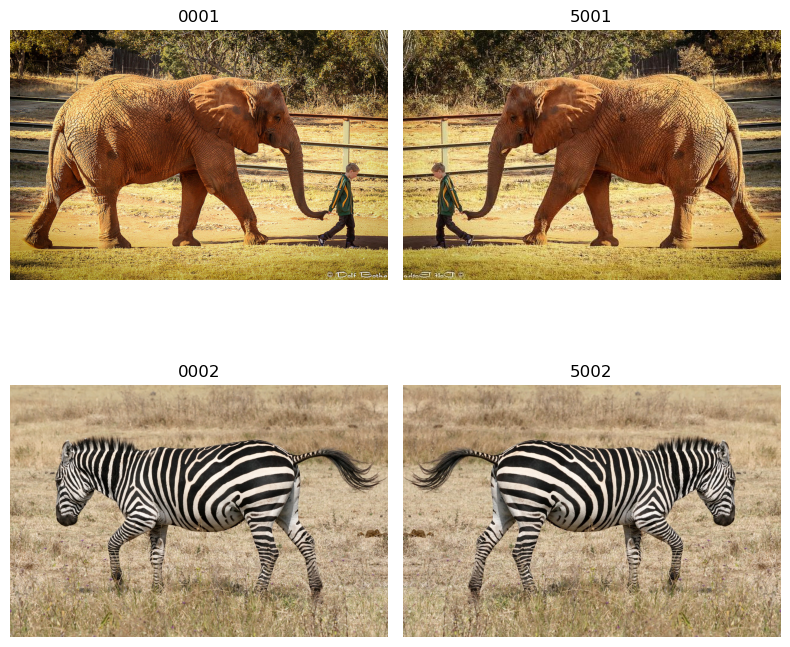

In [34]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def plot_image_grid(image_paths):
    fig, axes = plt.subplots(2, 2, figsize=(8, 8))

    for i, ax in enumerate(axes.flat):
        image_path = image_paths[i]
        image = mpimg.imread(image_path)
        ax.imshow(image)
        ax.axis('off')
        title = os.path.splitext(os.path.basename(image_path))[0]
        ax.set_title(title)
    plt.tight_layout()
    plt.show()

# 사용 예시
image_paths = [
    f'{TRAIN_DIRECTORY}/0001.jpg',
    f'{TRAIN_DIRECTORY}/5001.jpg',
    f'{TRAIN_DIRECTORY}/0002.jpg',
    f'{TRAIN_DIRECTORY}/5002.jpg'
]

plot_image_grid(image_paths)

In [35]:
def add_flip_row(df):
    new_df = []
    for idx in range(len(df)):
        tmp_row = df.iloc[idx]
        # box_width - box_right_top 구하고 
        if tmp_row["filename"] >1204:
            continue
        tmp_row["box_left_top_x"] = tmp_row["image_width"] - (tmp_row["box_left_top_x"] + tmp_row["box_width"])
        tmp_row["filename"] += 5000 
        new_df.append(tmp_row)
    new_df = pd.DataFrame(new_df)
    ret_df = pd.concat([new_df, df]).reset_index(drop=True)
        
    return ret_df    
flip_added_all = add_flip_row(all)
flip_added_all.head()

/tmp/ipykernel_28/4074089575.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp_row["box_left_top_x"] = tmp_row["image_width"] - (tmp_row["box_left_top_x"] + tmp_row["box_width"])
/tmp/ipykernel_28/4074089575.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp_row["filename"] += 5000


,filename,label,image_height,image_width,box_width,box_height,box_area,box_left_top_x,box_left_top_y
0,5001,1,423,640,521.000320,298.000116,155258.16,99.000000,75.000015
1,5002,3,1328,1992,1691.644248,893.708144,1511836.24,68.474004,249.448200
2,5003,2,440,600,417.000000,319.000000,133023.00,96.000000,67.999800
3,5004,2,1065,1600,1107.499200,836.168775,926056.25,110.000800,141.040613
4,5005,3,450,800,491.875200,314.392050,154641.65,245.624800,133.175475


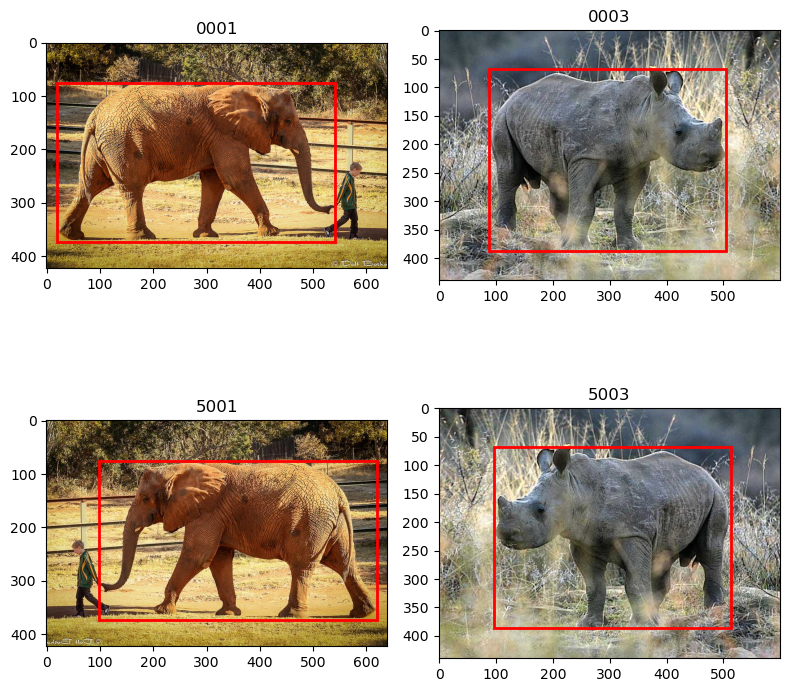

In [36]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd

def visualize_bounding_boxes(folder_path, df, imgs):
    fig, axes = plt.subplots(2, 2, figsize=(8, 8))
    axes = axes.flatten()

    for i, (filename, ax) in enumerate(zip(imgs, axes)):
        # 이미지 파일 경로
        image_path = os.path.join(folder_path, f"{filename}.jpg")
        # 이미지 로드
        image = plt.imread(image_path)

        # 이미지를 현재 축에 표시
        ax.imshow(image)
        ax.set_title(filename)
        # 해당 파일의 bounding box 정보 추출
        file_df = df[df['filename'] == int(filename)]
        # bounding box 정보를 반복하며 각각의 box를 그림
        for _, row in file_df.iterrows():
            box_width = row['box_width']
            box_height = row['box_height']
            box_left_top_x = row['box_left_top_x']
            box_left_top_y = row['box_left_top_y']

            # bounding box의 왼쪽 상단 좌표와 크기를 사용하여 Rectangle 패치 생성
            # rect = patches.Rectangle((box_left_top_x, box_left_top_y),
            #                          box_width, box_height,
            #                          linewidth=2, edgecolor='r', facecolor='none')
            
            rect = patches.Rectangle((box_left_top_x, box_left_top_y),
                                     box_width, box_height,
                                     linewidth=2, edgecolor='r', facecolor='none')

            # Rectangle 패치를 그림
            ax.add_patch(rect)
        
        # 축 설정
        # ax.axis('off')

    # 그림 출력
    plt.tight_layout()
    plt.show()

# 사용 예시
imgs = ['0001','0003','5001', '5003']  # 이미지 파일명 리스트

# bounding box 시각화
visualize_bounding_boxes(TRAIN_DIRECTORY, flip_added_all, imgs)

In [37]:
# Train, Test 파일 각각 갯수 세기
from glob import glob

print("기존 1204개, 300개에서 좌우대칭 된것 까지 추가됬음")
print(f'훈련 데이터 개수 : {len(glob(TRAIN_DIRECTORY +"/" +"*.jpg"))}')
print(f'테스트 데이터 개수 : {len(glob(TEST_DIRECTORY + "/"+ "*.jpg"))}')

기존 1204개, 300개에서 좌우대칭 된것 까지 추가됬음
훈련 데이터 개수 : 2408
테스트 데이터 개수 : 300


In [38]:
print(f"기존 dataframe 갯수 : {len(all)}")
print(f"새롭게 생성된 dataframe 갯수 : {len(flip_added_all)}")
print(f"기존 train_coco 갯수 : {len(train_coco)}")
print(f"기존 test_coco 갯수 : {len(test_coco)}")

기존 dataframe 갯수 : 2685
새롭게 생성된 dataframe 갯수 : 4812
기존 train_coco 갯수 : 2127
기존 test_coco 갯수 : 558


In [39]:
flip_added_all.head()

,filename,label,image_height,image_width,box_width,box_height,box_area,box_left_top_x,box_left_top_y
0,5001,1,423,640,521.000320,298.000116,155258.16,99.000000,75.000015
1,5002,3,1328,1992,1691.644248,893.708144,1511836.24,68.474004,249.448200
2,5003,2,440,600,417.000000,319.000000,133023.00,96.000000,67.999800
3,5004,2,1065,1600,1107.499200,836.168775,926056.25,110.000800,141.040613
4,5005,3,450,800,491.875200,314.392050,154641.65,245.624800,133.175475


In [41]:
flip_added_train_coco = flip_added_all[
    ((flip_added_all["filename"] >= 1) & (flip_added_all["filename"] <= 1204)) # 1~1204
    |  # or
    ((flip_added_all["filename"] >= 1+5000) & (flip_added_all["filename"] <= 1204+5000)) # 1+5000 ~ 1204+5000
].reset_index().copy().drop(columns=['index'])

flip_added_test_coco = flip_added_all[
    ((flip_added_all["filename"] >= 1205) & (flip_added_all["filename"] <= 1504 )) # 1205~1504
].reset_index().copy().drop(columns=['index'])

In [42]:
print(f"기존 train_coco 갯수 : {len(train_coco)}")
print(f"기존 test_coco 갯수 : {len(test_coco)}")
print(f"새로 생성된 train_coco 갯수 : {len(flip_added_train_coco)}")
print(f"새로 생성된  test_coco 갯수 : {len(flip_added_test_coco)}")

기존 train_coco 갯수 : 2127
기존 test_coco 갯수 : 558
새로 생성된 train_coco 갯수 : 4254
새로 생성된  test_coco 갯수 : 558


train_coco , test_coco annotation.json 으로 생성후에 각 test/train 폴더 속에 집어넣기

In [43]:
info_dict = {"info": {
    "year":"2022","version":"1",
    "description":"Exported from roboflow.ai",
    "contributor":"",
    "url":"https://public.roboflow.ai/object-detection/undefined","date_created":"2022-12-17T02:13:57+00:00"
}}

license_dict = {
    "licenses":[{"id":1,"url":"https://creativecommons.org/licenses/by/4.0/","name":"CC BY 4.0"}]
}

categories_dict = {
        "categories":[
        {"id": int(0), "name":"Water buffalo","supercategory":"animal"},
        {"id":int(1), "name":"Elephant","supercategory":"animal"},
        {"id":int(2), "name":"Rhinoceros","supercategory":"animal"},
        {"id":int(3), "name":"Zebra","supercategory":"animal"}
    ]
}

In [44]:
import json

def create_annotation_json(foler_path, df):
    images_dict = {
        "images": []
    }

    annotations_dict = {
        "annotations": []
    }
    
    image_set = set()

    for idx in range(len(df)):
        tmp_series = df.iloc[idx]

        if int(tmp_series['filename']) in image_set:
            continue
        else:
            tmp_image_dict = {
            "id": int(tmp_series['filename']),
            "file_name": str(int(tmp_series['filename'])).zfill(4) + ".jpg",
            "height": int(tmp_series['image_height']),
            "width": int(tmp_series['image_width'])
            }
            images_dict["images"].append(tmp_image_dict)
        
        tmp_annotation_dict = {
            "id": idx,
            "image_id": int(tmp_series['filename']),
            "category_id": int(tmp_series['label']),
            "bbox":[
                int(tmp_series['box_left_top_x']),
                int(tmp_series['box_left_top_y']),
                int(tmp_series['box_width']),
                int(tmp_series['box_height'])
            ],
            "area": int(tmp_series['box_area']),
        }
        annotations_dict["annotations"].append(tmp_annotation_dict)
        
    annotation_dict = {}
    annotation_dict.update(info_dict)
    annotation_dict.update(license_dict)
    annotation_dict.update(categories_dict)
    annotation_dict.update(images_dict)
    annotation_dict.update(annotations_dict)
    
    annotation_path  = os.path.join(foler_path, "_annotations.coco.json")
    
    with open(annotation_path, "w") as json_file:
        json.dump(annotation_dict, json_file)
        
    return 

In [45]:
create_annotation_json(TRAIN_DIRECTORY, flip_added_train_coco)
create_annotation_json(TEST_DIRECTORY, flip_added_test_coco)

모델 가져와서 훈련시킬준비해보자

In [46]:
import torch
import torchvision

print(torch.__version__)
print(torchvision.__version__)

2.0.0
0.15.1


In [47]:
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q roboflow
!pip install -q timm
!pip install pycocotools

Looking in indexes: https://test.pypi.org/simple/
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyterlab-lsp 4.1.0 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.
momepy 0.6.0 requires shapely>=2, but you have shapely 1.8.5.post1 which is incompatible.
pytoolconfig 1.2.5 requires packaging>=22.0, but you have packaging 21.3 which is incompatible.
ydata-profiling 4.1.2 requires scipy<1.10,>=1.4.1, but you have scipy 1.10.1 which is incompatible.
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0.6-cp310-cp310-linux_x86_64.whl size=93512 sha256=00bb0c6a59f4d0f54d4da2397aa812b92c4ff1317eb39e6a2d97ca25570ddc52
  Stored in directory: /root/.cache/pip/wheels/58/e6/f9/f87c8f8be098b51b616871

In [48]:
import torch
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

import roboflow
import supervision
import transformers
import pytorch_lightning

print(
    "roboflow:", roboflow.__version__, 
    "; supervision:", supervision.__version__, 
    "; transformers:", transformers.__version__, 
    "; pytorch_lightning:", pytorch_lightning.__version__
)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Mon_Apr__3_17:16:06_PDT_2023
Cuda compilation tools, release 12.1, V12.1.105
Build cuda_12.1.r12.1/compiler.32688072_0
torch:  2.0 ; cuda:  2.0.0


unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tensorflow13GcsFileSystemE']


roboflow: 1.0.9 ; supervision: 0.3.0 ; transformers: 4.29.2 ; pytorch_lightning: 2.0.2


In [49]:
import torch
from transformers import DetrForObjectDetection, DetrImageProcessor


# settings
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
CHECKPOINT = 'facebook/detr-resnet-50'
CONFIDENCE_TRESHOLD = 0.5
IOU_TRESHOLD = 0.75

image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)
model = DetrForObjectDetection.from_pretrained(CHECKPOINT)
model.to(DEVICE)

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

In [50]:
print(DEVICE)

cuda:0


In [51]:
import os
import torchvision

ANNOTATION_FILE_NAME = "_annotations.coco.json"
class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(
        self, 
        image_directory_path: str, 
        image_processor, 
        train: bool = True
    ):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)
        self.image_processor = image_processor

    def __getitem__(self, idx):
        images, annotations = super(CocoDetection, self).__getitem__(idx)        
        image_id = self.ids[idx]
        annotations = {'image_id': image_id, 'annotations': annotations}
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()
        target = encoding["labels"][0]

        return pixel_values, target


TRAIN_DATASET = CocoDetection(
    image_directory_path=TRAIN_DIRECTORY, 
    image_processor=image_processor, 
    train=True)

TEST_DATASET = CocoDetection(
    image_directory_path=TEST_DIRECTORY, 
    image_processor=image_processor, 
    train=False)

print("Number of training examples:", len(TRAIN_DATASET))
print("Number of test examples:", len(TEST_DATASET))

loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Number of training examples: 2408
Number of test examples: 300


Image #1103


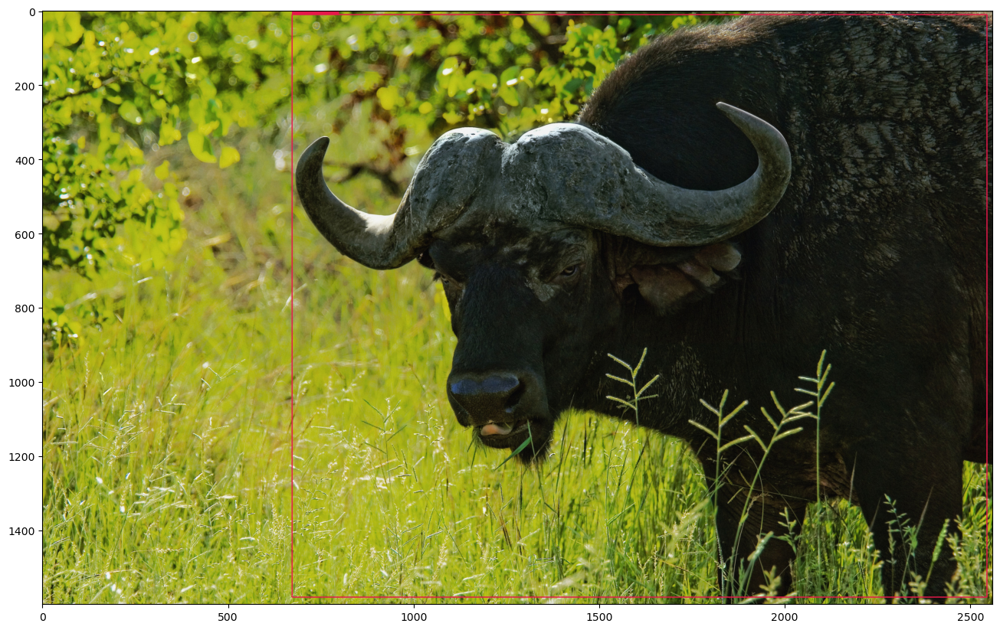

In [52]:
import random
import cv2
import numpy as np
import supervision as sv


# select random image
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons 
image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
annotations = TRAIN_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TRAIN_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

# we will use id2label function for training
categories = TRAIN_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}

labels = [
    f"{id2label[class_id]}" 
    for _, _, class_id, _ 
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline  
sv.show_frame_in_notebook(image, (16, 16))

Image #1450
../output/kaggle/working/test/1450.jpg
Detections(xyxy=array([[167,  19, 726, 414]]), class_id=array([0]), confidence=None, tracker_id=None)


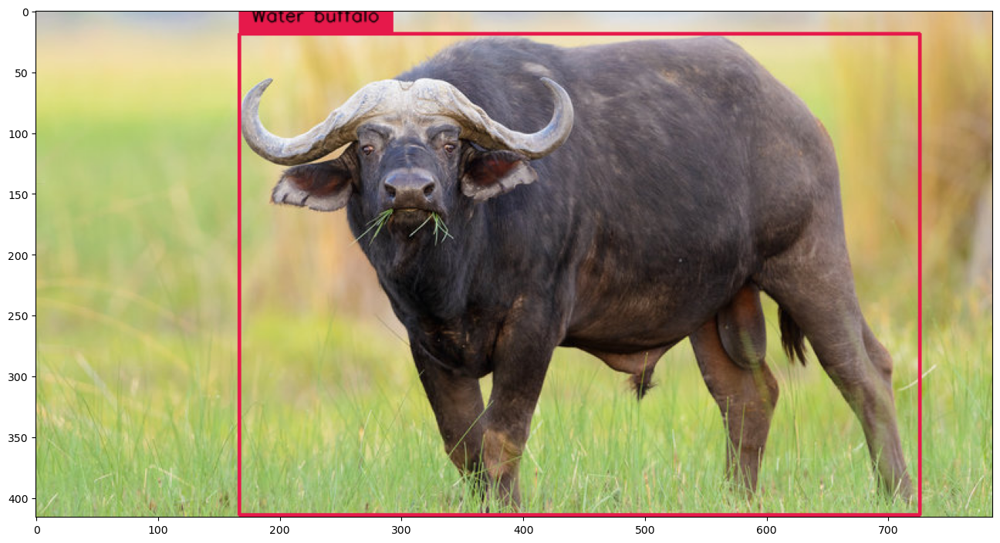

In [53]:
import random
import cv2
import numpy as np


# select random image
image_ids = TEST_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons 
image = TEST_DATASET.coco.loadImgs(image_id)[0]
annotations = TEST_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TEST_DATASET.root, image['file_name'])
print(image_path)
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

# we will use id2label function for training
categories = TEST_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}

labels = [
    f"{id2label[class_id]}" 
    for _, _, class_id, _ 
    in detections
]

box_annotator = sv.BoxAnnotator()
print(detections)
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)
%matplotlib inline  
sv.show_frame_in_notebook(image, (16, 16))

In [54]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    # DETR authors employ various image sizes during training, making it not possible 
    # to directly batch together images. Hence they pad the images to the biggest 
    # resolution in a given batch, and create a corresponding binary pixel_mask 
    # which indicates which pixels are real/which are padding
    pixel_values = [item[0] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item[1] for item in batch]
    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

TRAIN_DATALOADER = DataLoader(dataset=TRAIN_DATASET, collate_fn=collate_fn, batch_size=4, shuffle=True)
TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=4)

In [55]:
import pytorch_lightning as pl
from transformers import DetrForObjectDetection
import torch


class Detr(pl.LightningModule):

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=CHECKPOINT, 
            num_labels=len(id2label),
            ignore_mismatched_sizes=True
        )
        
        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)     
        # logs metrics for each training_step, and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def configure_optimizers(self):
        # DETR authors decided to use different learning rate for backbone
        # you can learn more about it here: 
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L22-L23
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L131-L139
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return TRAIN_DATALOADER

In [56]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(TRAIN_DATALOADER))
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([5, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([5]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [57]:
outputs.logits.shape

torch.Size([4, 100, 5])

In [58]:
import os
HOME = os.getcwd()
print(HOME)

%cd {HOME}

%load_ext tensorboard
%tensorboard --logdir lightning_logs/

/kaggle/working
/kaggle/working


In [59]:
from pytorch_lightning import Trainer

%cd {HOME}

# settings
MAX_EPOCHS = 50

# pytorch_lightning < 2.0.0
# trainer = Trainer(gpus=1, max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

# pytorch_lightning >= 2.0.0
trainer = Trainer(devices=1, accelerator="gpu", max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

trainer.fit(model)

/kaggle/working


Training: 0it [00:00, ?it/s]

In [62]:
model.to(DEVICE)

Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (drop_block): Identity()
                (act2): ReLU(inplace=True)
                (aa): Identity()
                (conv3): Conv2d(64, 256

Image #1442
ground truth


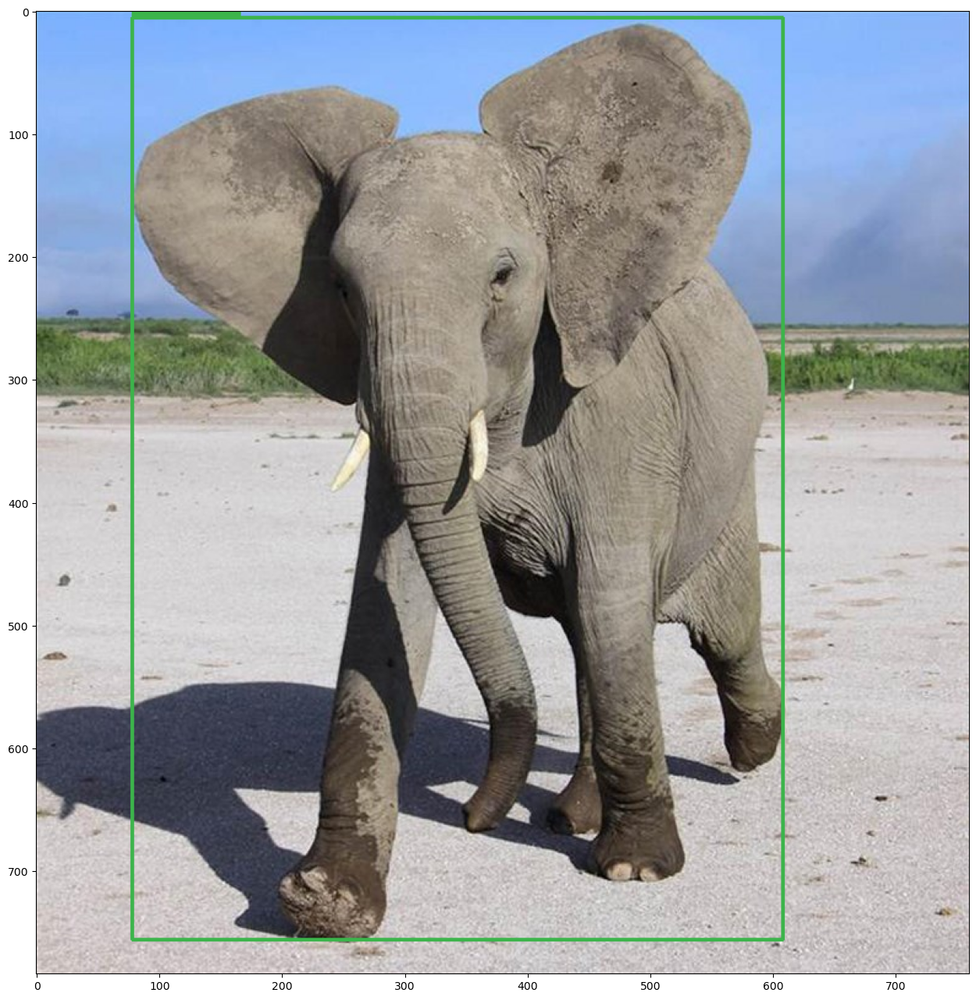

detections


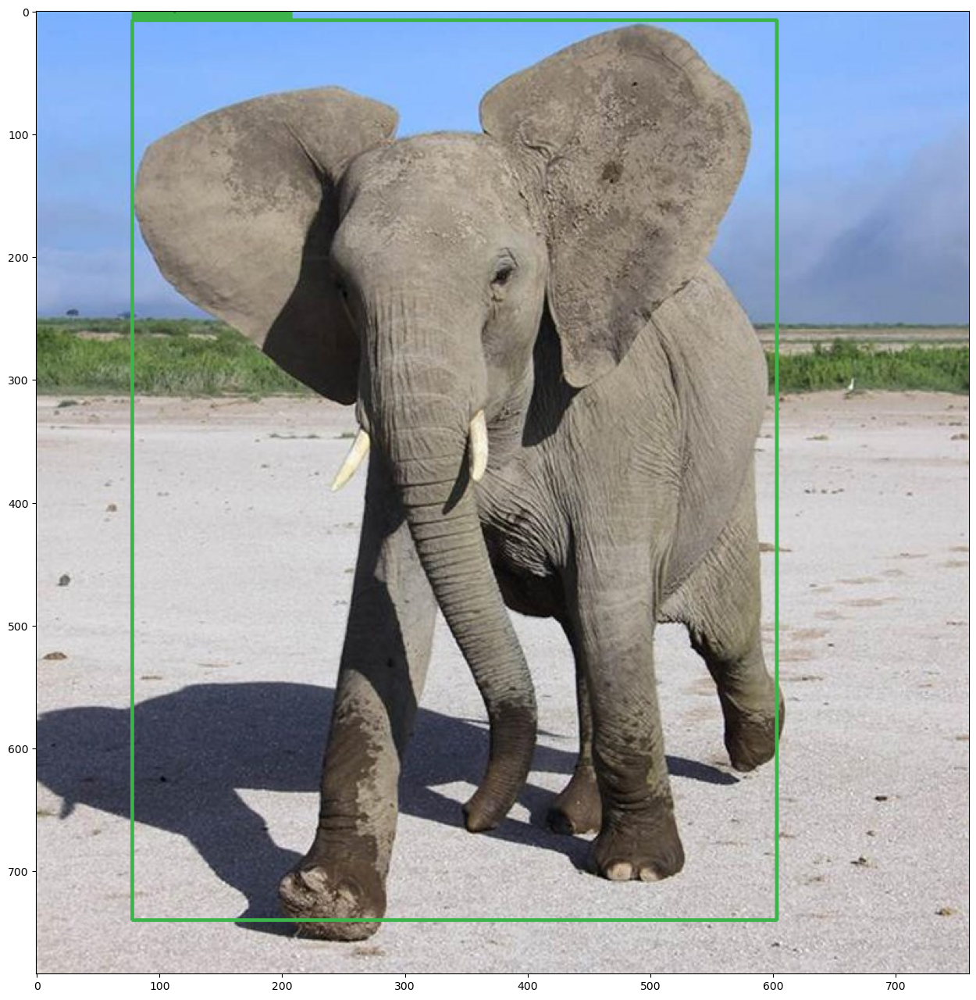

In [63]:
import random
import cv2
import numpy as np


# utils
categories = TEST_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}
box_annotator = sv.BoxAnnotator()

# select random image
image_ids = TEST_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons 
image = TEST_DATASET.coco.loadImgs(image_id)[0]
annotations = TEST_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TEST_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('ground truth')
%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

# inference
with torch.no_grad():

    # load image and predict
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs, 
        threshold=CONFIDENCE_TRESHOLD, 
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=0.5)
labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('detections')
%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

In [64]:
MODEL_PATH = os.path.join(HOME, 'custom-model')

In [65]:
model.model.save_pretrained(MODEL_PATH)

In [66]:
CONFIDENCE_TRESHOLD = 0.5
IOU_TRESHOLD = 0.75

import matplotlib.pyplot as plt
import os
import cv2 as cv
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from collections import Counter

In [67]:
ground_truths = []

for tmp_image in TEST_DATASET.coco.getImgIds():
  annotations = TEST_DATASET.coco.imgToAnns[tmp_image]
  # annotate
  detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
  for idx in range(len(detections.xyxy)):
    box_info = [tmp_image, detections.class_id[idx], 1.0, detections.xyxy[idx].tolist()]
    ground_truths.append(box_info)

print(ground_truths[:10])

[[1205, 1, 1.0, [230, 75, 618, 333]], [1205, 1, 1.0, [70, 249, 196, 342]], [1205, 1, 1.0, [134, 128, 442, 322]], [1206, 3, 1.0, [332, 118, 567, 420]], [1206, 3, 1.0, [137, 85, 287, 400]], [1206, 3, 1.0, [79, 65, 227, 295]], [1206, 3, 1.0, [267, 114, 428, 385]], [1206, 3, 1.0, [252, 74, 467, 164]], [1206, 3, 1.0, [85, 42, 251, 105]], [1206, 3, 1.0, [97, 1, 163, 53]]]


In [69]:
predictions = []

with torch.no_grad():
  for tmp_image in TEST_DATASET.coco.getImgIds():
    image = TEST_DATASET.coco.loadImgs(tmp_image)[0]
    annotations = TEST_DATASET.coco.imgToAnns[tmp_image]
    image_path = os.path.join(TEST_DATASET.root, image['file_name'])
    image = cv2.imread(image_path)

    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs, 
        threshold=CONFIDENCE_TRESHOLD, 
        target_sizes=target_sizes
    )[0]

    # annotate
    # print(tmp_image)
    if len(results['scores'].tolist()) ==0:
      continue
    else: 
      detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=0.5)
      for idx in range(len(detections.xyxy)):
        box_info = [tmp_image, detections.class_id[idx], detections.confidence[idx], detections.xyxy[idx].tolist()]
        predictions.append(box_info)

In [70]:
predictions[:10]

[[1205,
  1,
  0.99811196,
  [237.78211975097656,
   74.48686981201172,
   617.0780029296875,
   321.517822265625]],
 [1205,
  1,
  0.9969752,
  [129.778076171875,
   126.27013397216797,
   386.96295166015625,
   326.2175598144531]],
 [1205,
  1,
  0.99282324,
  [69.99310302734375,
   245.52867126464844,
   191.04515075683594,
   341.8114929199219]],
 [1206,
  3,
  0.9979728,
  [134.97265625, 85.62359619140625, 295.8974914550781, 391.3004455566406]],
 [1206,
  3,
  0.9972825,
  [266.8206481933594,
   114.21222686767578,
   567.0299682617188,
   402.9433898925781]],
 [1206,
  3,
  0.96886015,
  [260.23223876953125,
   69.32201385498047,
   474.8527526855469,
   167.6676788330078]],
 [1206,
  3,
  0.9667549,
  [0.9665513038635254,
   121.18311309814453,
   67.5613021850586,
   373.4002685546875]],
 [1206,
  3,
  0.95016515,
  [75.98924255371094,
   55.8765983581543,
   165.84786987304688,
   294.52203369140625]],
 [1206,
  3,
  0.835289,
  [345.03271484375, 23.50901222229004, 548.4390869

In [71]:
classes = [0,1,2,3]

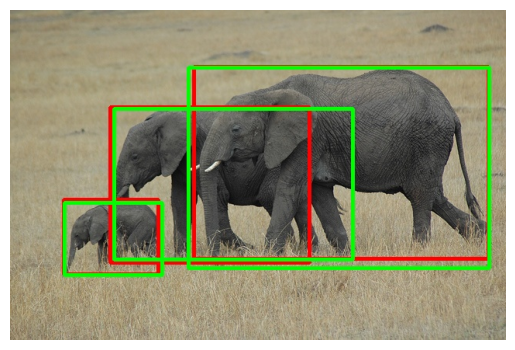

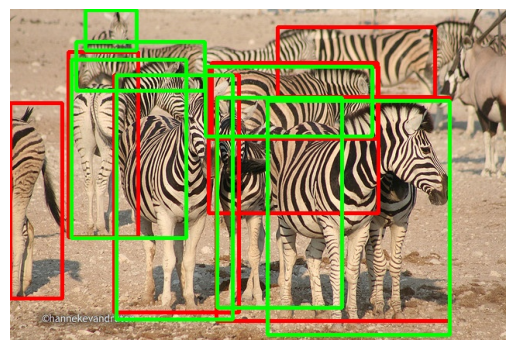

In [72]:
import os
# 폴더 생성


os.makedirs('../output/kaggle/working/results', exist_ok=True)
# 디
def boxPlot(boxlist, imagePath, savePath):
    labelfiles = sorted(list(set([filename for filename, _, _, _ in boxlist])))
    
    for labelfile in labelfiles:
    
        rectinfos = []
        imgfilePath = os.path.join(imagePath, str(labelfile) + ".jpg")
        img = cv.imread(imgfilePath)

        for filename, _, conf, (x1, y1, x2, y2) in boxlist:
            if labelfile == filename:
                rectinfos.append((x1, y1, x2, y2, conf))
                
        for x1, y1, x2, y2, conf in rectinfos:
            
            if conf == 1.0:
                rectcolor = (0, 255, 0)
            else:
                rectcolor = (0, 0, 255)
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
            cv.rectangle(img, (x1, y1), (x2, y2), rectcolor, 4)
        cv.imwrite(f"{savePath}/{labelfile}.jpg", img)

        img = mpimg.imread(f"{savePath}/{labelfile}.jpg")
        plt.axis("off")
        plt.imshow(img)
        plt.show()
        
# boxPlot(detections, "image", savePath="boxed_images/detection")
# boxPlot(groundtruths, "image", savePath="boxed_images/groundtruth")
boxPlot(predictions[:10] + ground_truths[:10], TEST_DIRECTORY, savePath="../output/kaggle/working/results")

In [73]:
def getArea(box):
    return (box[2] - box[0] + 1) * (box[3] - box[1] + 1)


def getUnionAreas(boxA, boxB, interArea=None):
    area_A = getArea(boxA)
    area_B = getArea(boxB)
    
    if interArea is None:
        interArea = getIntersectionArea(boxA, boxB)
        
    return float(area_A + area_B - interArea)

def getIntersectionArea(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    # intersection area
    return (xB - xA + 1) * (yB - yA + 1)

In [74]:
def boxesIntersect(boxA, boxB):
    if boxA[0] > boxB[2]:
        return False  # boxA is right of boxB
    if boxB[0] > boxA[2]:
        return False  # boxA is left of boxB
    if boxA[3] < boxB[1]:
        return False  # boxA is above boxB
    if boxA[1] > boxB[3]:
        return False  # boxA is below boxB
    return True

def iou(boxA, boxB):
    # if boxes dont intersect
    if boxesIntersect(boxA, boxB) is False:
        return 0
    interArea = getIntersectionArea(boxA, boxB)
    union = getUnionAreas(boxA, boxB, interArea=interArea)
    
    # intersection over union
    result = interArea / union
    assert result >= 0
    return result

In [75]:
boxA = predictions[-1][-1]
boxB = ground_truths[-1][-1]

print(f"boxA coordinates : {(boxA)}")
print(f"boxA area : {getArea(boxA)}")
print(f"boxB coordinates : {(boxB)}")
print(f"boxB area : {getArea(boxB)}")

print(f"Union area of boxA and boxB : {getUnionAreas(boxA, boxB)}")

print(f"Does boxes Intersect? : {boxesIntersect(boxA, boxB)}")

print(f"Intersection area of boxA and boxB : {getIntersectionArea(boxA, boxB)}")

print(f"IoU of boxA and boxB : {iou(boxA, boxB)}")

boxA coordinates : [202.70916748046875, 184.9779815673828, 473.42938232421875, 315.2507629394531]
boxA area : 35669.46835755557
boxB coordinates : [193, 190, 457, 318]
boxB area : 34185
Union area of boxA and boxB : 37623.8059805166
Does boxes Intersect? : True
Intersection area of boxA and boxB : 32230.66237703897
IoU of boxA and boxB : 0.856656086142097


In [76]:
def calculateAveragePrecision(rec, prec):
    
    mrec = [0] + [e for e in rec] + [1]
    mpre = [0] + [e for e in prec] + [0]

    for i in range(len(mpre)-1, 0, -1):
        mpre[i-1] = max(mpre[i-1], mpre[i])

    ii = []

    for i in range(len(mrec)-1):
        if mrec[1:][i] != mrec[0:-1][i]:
            ii.append(i+1)

    ap = 0
    for i in ii:
        ap = ap + np.sum((mrec[i] - mrec[i-1]) * mpre[i])
    
    return [ap, mpre[0:len(mpre)-1], mrec[0:len(mpre)-1], ii]

In [77]:
def ElevenPointInterpolatedAP(rec, prec):

    mrec = [e for e in rec]
    mpre = [e for e in prec]

    recallValues = np.linspace(0, 1, 11)
    recallValues = list(recallValues[::-1])
    rhoInterp, recallValid = [], []

    for r in recallValues:
        argGreaterRecalls = np.argwhere(mrec[:] >= r)
        pmax = 0

        if argGreaterRecalls.size != 0:
            pmax = max(mpre[argGreaterRecalls.min():])

        recallValid.append(r)
        rhoInterp.append(pmax)

    ap = sum(rhoInterp) / 11

    return [ap, rhoInterp, recallValues, None]

In [78]:
def AP(detections, groundtruths, classes, IOUThreshold = 0.3, method = 'AP'):
    
    result = []
    
    for c in classes:

        dects = [d for d in detections if d[1] == c]
        gts = [g for g in groundtruths if g[1] == c]

        npos = len(gts)

        dects = sorted(dects, key = lambda conf : conf[2], reverse=True)

        TP = np.zeros(len(dects))
        FP = np.zeros(len(dects))

        det = Counter(cc[0] for cc in gts)

        # 각 이미지별 ground truth box의 수
        # {99 : 2, 380 : 4, ....}
        # {99 : [0, 0], 380 : [0, 0, 0, 0], ...}
        for key, val in det.items():
            det[key] = np.zeros(val)


        for d in range(len(dects)):


            gt = [gt for gt in gts if gt[0] == dects[d][0]]

            iouMax = 0

            for j in range(len(gt)):
                iou1 = iou(dects[d][3], gt[j][3])
                if iou1 > iouMax:
                    iouMax = iou1
                    jmax = j

            if iouMax >= IOUThreshold:
                if det[dects[d][0]][jmax] == 0:
                    TP[d] = 1
                    det[dects[d][0]][jmax] = 1
                else:
                    FP[d] = 1
            else:
                FP[d] = 1

        acc_FP = np.cumsum(FP)
        acc_TP = np.cumsum(TP)
        rec = acc_TP / npos
        prec = np.divide(acc_TP, (acc_FP + acc_TP))

        if method == "AP":
            [ap, mpre, mrec, ii] = calculateAveragePrecision(rec, prec)
        else:
            [ap, mpre, mrec, _] = ElevenPointInterpolatedAP(rec, prec)

        r = {
            'class' : c,
            'precision' : prec,
            'recall' : rec,
            'AP' : ap,
            'interpolated precision' : mpre,
            'interpolated recall' : mrec,
            'total positives' : npos,
            'total TP' : np.sum(TP),
            'total FP' : np.sum(FP)
        }

        result.append(r)

    return result

result = AP(predictions, ground_truths, classes)
print(result)

[{'class': 0, 'precision': array([1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.  

In [79]:
def mAP(result):
    ap = 0
    for r in result:
        ap += r['AP']
    mAP = ap / len(result)
    
    return mAP

In [80]:
num2class = {"0" : "buffalo", "1" : "elephant", "2" : "rhino", "3" : "zebra"}

In [81]:
for r in result:
    print("{:^8} AP : {}".format(num2class[str(r['class'])], r['AP']))
print("---------------------------")
print(f"mAP : {mAP(result)}")


buffalo  AP : 0.8856930591085025
elephant AP : 0.8756294614931475
 rhino   AP : 0.92526682856965
 zebra   AP : 0.9127021624394345
---------------------------
mAP : 0.8998228779026836
